Aim of the notebook:
1. Analyse the interaction of hand taps between singer and harmonium player
2. Plot the pitch contour and spectrogram directly without first computing the values and then plotting
3. Compute all quantities from the audio file directly instead of loading the audio separately in the notebook

1. Import libraries

In [53]:
import json
import sys
sys.path.append('../')
import utils as ul
import librosa
import numpy as np
import os
import shutil

2. Load relevant file paths and analysis parameters from metadata json file

In [27]:
f = open('audios/3/metadata.json')
metadata = json.load(f)

In [28]:
metadata

{'video_path': 'audios/3/VS_Shree_1235_1321.mp4',
 'vox_audio_path': 'audios/3/VS_Shree_1235_1321_SS.wav',
 'mix_audio_path': 'audios/3/VS_Shree_1235_1321.mp4',
 'min_pitch': 164.81,
 'max_pitch': 659.25,
 'annotation_path': 'audios/3/Observer.csv',
 'temp_folder': 'audios/3/Temp/',
 'vid_size': [720, 576],
 'Tap_S': {'pos1': [325, 325], 'pos2': [365, 365], 'color': 'red'},
 'Tap_H': {'pos1': [462, 325], 'pos2': [502, 365], 'color': 'green'},
 'tonic': 220,
 'notes': [{'label': 'P_', 'cents': -500},
  {'label': 'd_', 'cents': -400},
  {'label': 'N_', 'cents': -100},
  {'label': 'S', 'cents': 0},
  {'label': 'r', 'cents': 100},
  {'label': 'G', 'cents': 400},
  {'label': 'M', 'cents': 600},
  {'label': 'P', 'cents': 700},
  {'label': 'd', 'cents': 800},
  {'label': 'N', 'cents': 1100},
  {'label': "S'", 'cents': 1200},
  {'label': "r'", 'cents': 1300},
  {'label': "G'", 'cents': 1600},
  {'label': "M'", 'cents': 1800},
  {'label': "P'", 'cents': 1900}]}

In [36]:
# other parameters
fs = 16000
win_dur = 40e-3
hop_dur = 10e-3
win_size = int(np.ceil(win_dur*fs))
hop_size = int(np.ceil(hop_dur*fs))
n_fft = int(2**(np.ceil(np.log2(win_size))))

In [37]:
# store the keywords referring to the hand tapping in a list. Tap_S refers to the singer's hand taps and Tap_H refers to the harmonium player's taps.
annotation_keywords = ['Tap_S', 'Tap_H']

In [45]:
# extract positions and colours into lists for the given annotation_keywords
pos = [[metadata[keyword]['pos1'], metadata[keyword]['pos2']] for keyword in annotation_keywords]
colorsAnnot = [metadata[keyword]['color'] for keyword in annotation_keywords]

3. Load the audio and play the video and audio files separately

In [40]:
ul.playVideo(videoPath=metadata['video_path'])

In [41]:
ul.playAudio(audioPath=metadata['vox_audio_path'], sr=fs)

4. Plot the pitch contour and spectrogram data directly (without computing the values separately).

Parameters used here
1. onsetTimeKeyword - list of columns in the onset annotation file with time stamps of annotations to plot
2. annotLabel - determines whether there will be a text label associated with every annotation line
3. providedAlpha - determines the opacity of the plotted line

In [48]:
%%capture
# initialise figure, with 3 subplots
fig, axs = ul.generateFig(3, (14, 14), [2, 3, 3])
# plot waveplot
axs[0] = ul.drawWave(audioPath=metadata['vox_audio_path'], sr=fs, ax=axs[0])
# plot spectrogram
axs[1] = ul.spectrogram(audioPath=metadata['vox_audio_path'], ax=axs[1], yticks=True, annotate=False)
# plot pitch contour
axs[2] = ul.pitchContour(audioPath=metadata['vox_audio_path'], minPitch=metadata['min_pitch'], 
                         maxPitch=metadata['max_pitch'], ax=axs[2], annotate=True, 
                         onsetPath=metadata['annotation_path'], xticks=True, 
                         onsetTimeKeyword=annotation_keywords, cAnnot=colorsAnnot, 
                         annotLabel=False, ylim=(-600, 900), providedAlpha=0.4)

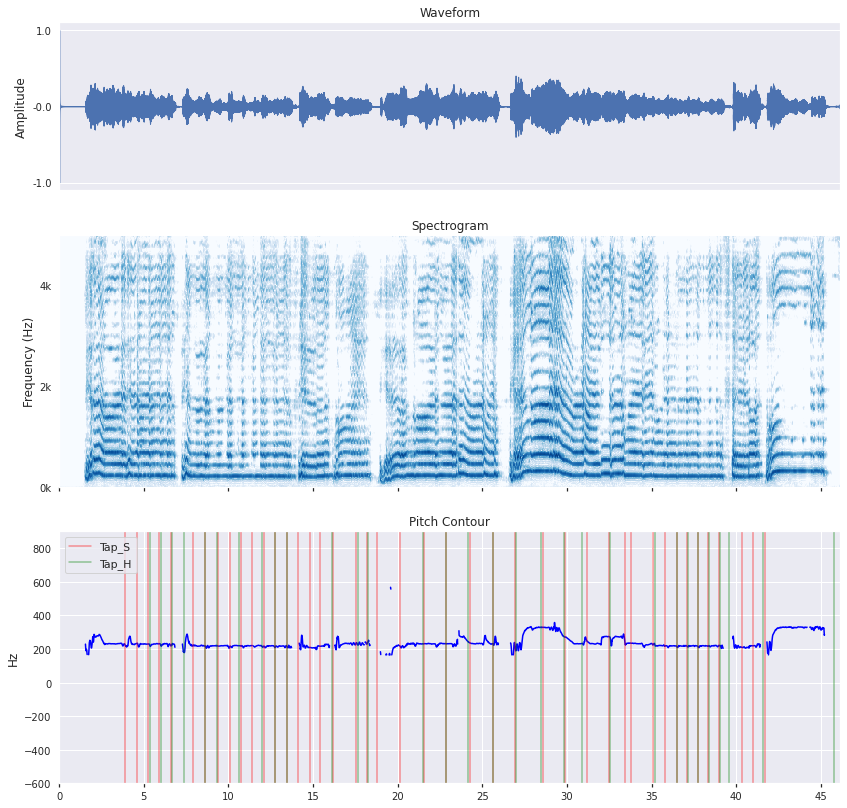

In [49]:
fig

5. Video Manipulation

Now to generate a video with the hand taps highlighted, we create a temp folder where the intermediate files will be stored.

In [18]:
os.makedirs(metadata['temp_folder'], exist_ok=True)

6. Generate and play the video

In [50]:
ul.generateVideo(annotationFile=metadata['annotation_path'], onsetKeywords=annotation_keywords, vidPath=metadata['video_path'], tempFolder=metadata['temp_folder'], pos=pos, cs=colorsVid)

/home/nithya/anaconda3/envs/osfVis/lib/python3.9/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


Video saved at audios/3/Temp/finalVid.mp4


In [51]:
ul.playVideo(videoPath=os.path.join(metadata['temp_folder'], 'finalVid.mp4'))

7. Delete the temporary folder

In [54]:
shutil.rmtree(metadata['temp_folder'])